In [ ]:
import os
import numpy as np
import glob
import shutil

import tensorflow as tf
import matplotlib.pyplot as plt

import datetime

In [ ]:
from tensorflow import keras
import keras.layers as layers
from keras.preprocessing.image import ImageDataGenerator as gen

In [ ]:
URL = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
zip_file = tf.keras.utils.get_file(
    origin=URL,
    fname='flower_photos.tgz',
    extract=True
)
base_dir = os.path.join(os.path.dirname(zip_file), 'flower_photos')
print(base_dir)

228827136/228813984 [==============================] - 3s 0us/step
/root/.keras/datasets/flower_photos


In [ ]:
# classes = os.listdir(base_dir)[:-1] # this is not effective since the foler has licence.txt which may also be mistaken as a class
classes = ['roses', 'daisy', 'dandelion', 'sunflowers', 'tulips']

Downloaded dataset has following directory structure.

<pre style="font-size: 10.0pt; font-family: Arial; line-height: 2; letter-spacing: 1.0pt;" >
<b>flower_photos</b>
|__ <b>daisy</b>
|__ <b>dandelion</b>
|__ <b>roses</b>
|__ <b>sunflowers</b>
|__ <b>tulips</b>
</pre>

There are no folders containing training and validation data. hence, we will have to create our own training and validation set.



In [ ]:
for cl in classes:
  img_path = os.path.join(base_dir, cl)
  images = glob.glob(img_path + '/*.jpg')
  print("{}: {} Images".format(cl, len(images)))
  train, val = images[:round(len(images)*0.8)], images[round(len(images)*0.8):]

  for t in train:
    if not os.path.exists(os.path.join(base_dir, 'train', cl)):
      os.makedirs(os.path.join(base_dir, 'train', cl))
    shutil.move(t, os.path.join(base_dir, 'train', cl))

  for v in val:
    if not os.path.exists(os.path.join(base_dir, 'val', cl)):
      os.makedirs(os.path.join(base_dir, 'val', cl))
    shutil.move(v, os.path.join(base_dir, 'val', cl))

roses: 641 Images
daisy: 633 Images
dandelion: 898 Images
sunflowers: 699 Images
tulips: 799 Images


In [ ]:
! tree /root/.keras/datasets/flower_photos/ -L 1

/bin/bash: tree: command not found


In [ ]:
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')

## Data augmentation

In [ ]:
batch_size = 100
IMG_SHAPE = 150

### Random horizontal flip  


Use ImageDataGenerator to create a transformation that rescales the images by 255 and then applies a random horizontal flip. Then use the `.flow_from_directory` method to apply the above transformation to the images in our training set. Make sure you indicate the batch size, the path to the directory of the training images, the target size for the images, and to shuffle the images. 

```
gen: ImageDataGenerator (
    featurewise_center=False,
    samplewise_center=False, 
    featurewise_std_normalization=False, 
    samplewise_std_normalization=False, 
    zca_whitening=False, zca_epsilon=0.000001, 
    rotation_range=0, 
    width_shift_range=0, 
    height_shift_range=0, 
    brightness_range=None, 
    shear_range=0, zoom_range=0, 
    channel_shift_range=0, 
    fill_mode='nearest', 
    cval=0, 
    horizontal_flip=False, 
    vertical_flip=False, 
    rescale=None, 
    preprocessing_function=None, 
    data_format=None, 
    validation_split=0, 
    dtype=None
)
```

In [ ]:
image_gen = gen(rescale=1./255, horizontal_flip=True)

train_data_gen = image_gen.flow_from_directory(
    batch_size=batch_size,
    directory=train_dir,
    shuffle=True,
    target_size=(IMG_SHAPE, IMG_SHAPE)
)

Found 2935 images belonging to 5 classes.


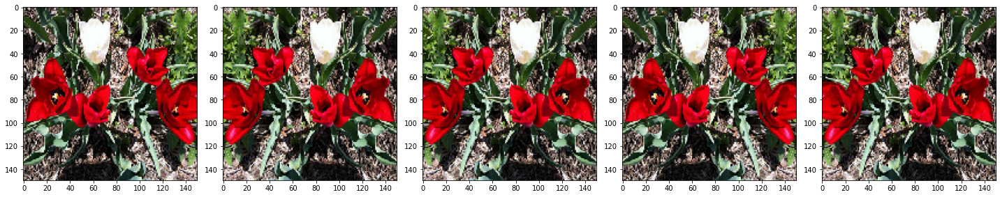

In [ ]:
def plotImages(images):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip(images, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

### Random rotation  
ImageDataGenerator to create a transformation that rescales the images by 255 and then applies a random 45 degree rotation. Then use the `.flow_from_directory` method to apply the above transformation to the images in our training set. Make sure you indicate the **batch size**, the **path to the directory of the training images**, the target size for the images, and to **shuffle** the images. 

In [ ]:
image_gen = gen(rescale=1./255, rotation_range=45)
train_data_gen = image_gen.flow_from_directory(
    batch_size=batch_size,
    directory=train_dir,
    shuffle=True,
    target_size=(IMG_SHAPE, IMG_SHAPE)
)

Found 2935 images belonging to 5 classes.


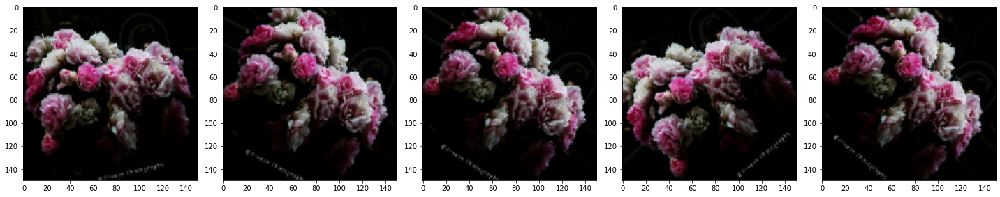

In [ ]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

### Random zoom

In [ ]:
image_gen = gen(rescale=1./255, zoom_range=0.5)
train_data_gen = image_gen.flow_from_directory(
    batch_size=batch_size,
    directory=train_dir,
    shuffle=True,
    target_size=(IMG_SHAPE, IMG_SHAPE)
)

Found 2935 images belonging to 5 classes.


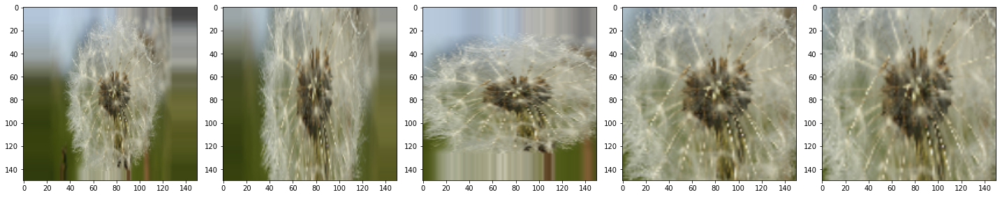

In [ ]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

### Rotate, zoom, flip  
- random 45 degree rotation
- random zoom of up to 50%
- random horizontal flip
- width shift of 0.15
- height shift of 0.15

In [ ]:
image_gen_train = gen(
    rescale=1./255,
    rotation_range=45,
    zoom_range=0.5,
    horizontal_flip=True,
    width_shift_range=0.15,
    height_shift_range=0.15,
    
)

Use the `.flow_from_directory` method to apply the above transformation to the images in our training set. Indicate the 
- batch size,
- path to the directory of the training images, 
- target size for the images,
- shuffle the images,
- set the class mode to `sparse`.

In [ ]:
train_data_gen = image_gen_train.flow_from_directory(
    batch_size=batch_size,
    directory=train_dir,
    target_size=(IMG_SHAPE,IMG_SHAPE),
    shuffle=True,
    class_mode='sparse',    
)

Found 2935 images belonging to 5 classes.


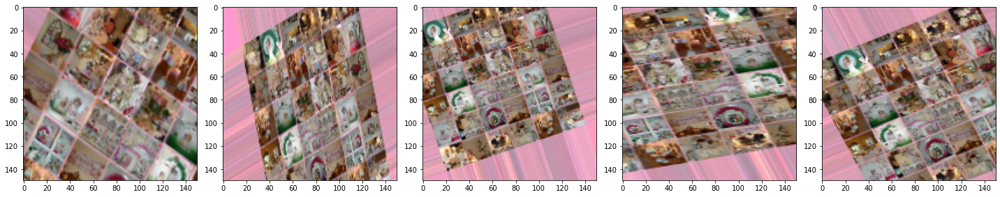

In [ ]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

### Create data generator for the validation set  
Data augmentation is only applied to traininig examples. Therefore, below, 
- ImageDataGenerator is used to create a transformation that only rescales by 255  

Then,  
- `flow_from_directory` is used to apply the above transformation to the images in the validation set  

Indicate:
- batch size
- path of directory of validation images
- target size
- class mode to `sparse` 

NB: *It is **not** neccesary to to shuffle images in the **validation set**.*


In [ ]:
image_gen_val = gen(rescale=1./255)
val_data_gen = image_gen_val.flow_from_directory(
    batch_size=batch_size,
    directory=val_dir,
    target_size=(IMG_SHAPE, IMG_SHAPE),
    class_mode='sparse',
    shuffle=False
)

Found 735 images belonging to 5 classes.


## Build model

### Create CNN  
Create a network with **3 convolution blocks**  
Each block has:
- `Conv2D` layer
- max pool layer

**Filters**  
- First - 16 filters
- Second - 32 filters
- Third - 64 filters

> All convolution filters should be `(3,3)`  
> All max pool layers should have `pool_size` of `(2,2)`  

After the 3 blocks,
- flatten layer
- fully connected layer with 512 units

> dropout rate = 20%  
> layers should use the `relu`  
> output layer should use `softmax` to output the 5 probability classes


In [ ]:
model = keras.models.Sequential(
    [
     layers.Conv2D(16, (3,3), activation='relu', input_shape=(150,150,3)),
     layers.MaxPooling2D(2,2),

     layers.Conv2D(32, (3,3), activation='relu'),
     layers.MaxPooling2D(2,2),

     layers.Conv2D(64, (3,3), activation='relu'),
     layers.MaxPooling2D(2,2),

     #dropout
     layers.Dropout(0.3),
     layers.Flatten(),
     layers.Dense(512, activation='relu'),
     layers.Dense(5, activation='softmax')
    ]
)

### Compile the model  
- `adam` optimizer
- sparse crossentropy loss function
- pass the `metrics` argument for visualizing training and validation accuracy

In [ ]:
model.compile(
    optimizer='adam',
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=['accuracy']
)

#### Create a logs directory for tensorboard

In [ ]:
if not os.path.exists('logs'):
    os.mkdir('logs')

# clear aly logs from previous runs
! rm -rf ./logs/

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
# model.build(input_shape)
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 74, 74, 16)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 36, 36, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 34, 34, 64)        18496     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 17, 17, 64)      

### Train the model  
Use the `fit_generator` instead of `fit`, since we are using the **ImageDataGenerator** to generate batches of training and validation data  
- epochs = 80

In [ ]:
epochs = 50
history = model.fit(
    train_data_gen,
    # steps_per_epoch=int(np.ceil(total_train / float(batch_size),
    epochs = epochs,
    validation_data = val_data_gen,
    callbacks=[tensorboard_callback]
)

Epoch 1/50
30/30 [==============================] - 29s 958ms/step - loss: 1.5508 - accuracy: 0.3554 - val_loss: 1.2184 - val_accuracy: 0.5034
Epoch 2/50
30/30 [==============================] - 24s 816ms/step - loss: 1.1665 - accuracy: 0.5179 - val_loss: 1.0986 - val_accuracy: 0.5388
Epoch 3/50
30/30 [==============================] - 25s 866ms/step - loss: 1.0617 - accuracy: 0.5738 - val_loss: 1.0032 - val_accuracy: 0.6272
Epoch 4/50
30/30 [==============================] - 24s 791ms/step - loss: 1.0373 - accuracy: 0.5874 - val_loss: 0.9703 - val_accuracy: 0.6381
Epoch 5/50
30/30 [==============================] - 23s 785ms/step - loss: 0.9420 - accuracy: 0.6273 - val_loss: 0.9995 - val_accuracy: 0.5959
Epoch 6/50
30/30 [==============================] - 24s 799ms/step - loss: 0.9026 - accuracy: 0.6453 - val_loss: 0.8477 - val_accuracy: 0.6816
Epoch 7/50
30/30 [==============================] - 23s 780ms/step - loss: 0.8918 - accuracy: 0.6583 - val_loss: 0.9313 - val_accuracy: 0.6272

# Visualization

## Accuracy and loss using matplotlib

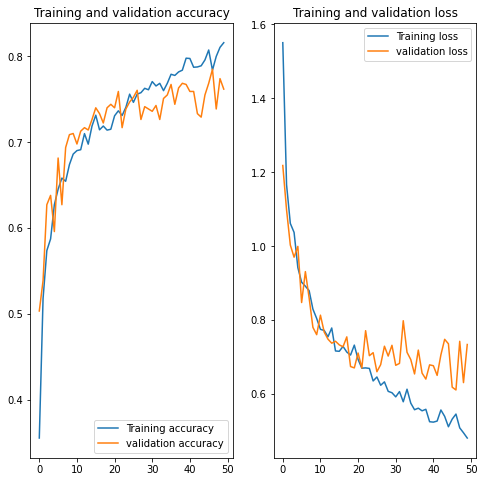

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label='Training accuracy')
plt.plot(epochs_range, val_acc, label='validation accuracy')
plt.legend(loc='lower right')
plt.title('Training and validation accuracy')

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label='Training loss')
plt.plot(epochs_range, val_loss, label='validation loss')
plt.legend(loc='upper right')
plt.title('Training and validation loss')
plt.show()

## Using tensorboard  
This is used in visualizing model perfomance over each epochs

In [ ]:
from tensorboard import notebook
%load_ext tensorboard
%tensorboard --logdir logs/fit 
notebook.display(port=6006, height=1000) 


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 3778), started 0:22:06 ago. (Use '!kill 3778' to kill it.)

<IPython.core.display.Javascript object>

Selecting TensorBoard with logdir logs/fit (started 0:22:06 ago; port 6006, pid 3778).


<IPython.core.display.Javascript object>